### Displaying images to get to know more about the Dataset

In [1]:
import cv2
import matplotlib.pyplot as plt
import os

In [2]:
import glob
import re

# Define paths
original_folder = "/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/"
reconstructed_folder = "/Users/rohitmaity/Desktop/LIDC/Notebook/VAE generated images/alpha_0/lidc_reco_images_alpha_0/"

# Function to extract natural sort key
def natural_sort_key(text):
    return [int(chunk) if chunk.isdigit() else chunk.lower() for chunk in re.split(r'(\d+)', text)]

# Get image paths and apply natural sorting
original_paths = sorted(glob.glob(original_folder + "*.jpg"), key=natural_sort_key)[:20]
reconstructed_paths = sorted(glob.glob(reconstructed_folder + "*.jpg"), key=natural_sort_key)[:20]

print("Original Images: \n", original_paths)
print("\nReconstructed Images: \n", reconstructed_paths)

Original Images: 
 ['/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/1.jpg', '/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/2.jpg', '/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/3.jpg', '/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/4.jpg', '/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/5.jpg', '/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/6.jpg', '/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/7.jpg', '/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/8.jpg', '/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/9.jpg', '/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/10.jpg',

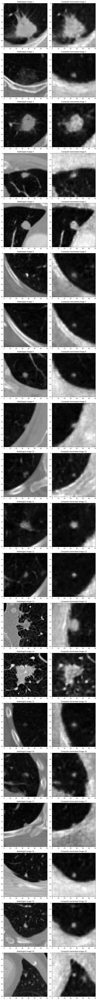

In [3]:
# Determine the number of images to display safely
num_images = min(len(original_paths), len(reconstructed_paths))

# Ensure there are images to display
if num_images == 0:
    raise ValueError("No images found in one or both directories. Check file paths!")

fig, axes = plt.subplots(num_images, 2, figsize=(10, 5 * num_images))

for i in range(num_images):
    # Load images in grayscale
    original_img = cv2.imread(original_paths[i], cv2.IMREAD_GRAYSCALE)
    reconstructed_img = cv2.imread(reconstructed_paths[i], cv2.IMREAD_GRAYSCALE)

    # Handle NoneType images (failed loads)
    if original_img is None or reconstructed_img is None:
        print(f"Warning: Could not load image {i}. Skipping...")
        continue

    # Display images
    axes[i, 0].imshow(original_img, cmap="gray")
    axes[i, 0].set_title(f"Radiologist Image {i+1}")

    axes[i, 1].imshow(reconstructed_img, cmap="gray")
    axes[i, 1].set_title(f"Computer-Generated Image {i+1}")

plt.tight_layout()
plt.show()


### Compare Pixel Intensity Histograms

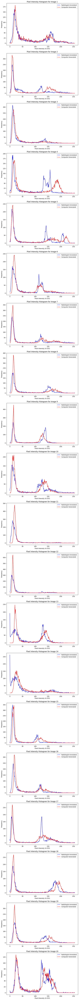

In [4]:
import numpy as np

# Plot histograms for all image pairs
fig, axes = plt.subplots(num_images, 1, figsize=(8, 5 * num_images))

for i in range(num_images):
    original_img = cv2.imread(original_paths[i], cv2.IMREAD_GRAYSCALE)
    reconstructed_img = cv2.imread(reconstructed_paths[i], cv2.IMREAD_GRAYSCALE)

    # Compute histograms
    hist_original = cv2.calcHist([original_img], [0], None, [256], [0, 256])
    hist_reconstructed = cv2.calcHist([reconstructed_img], [0], None, [256], [0, 256])

    # Plot histograms
    axes[i].plot(hist_original, label="Radiologist-Annotated", color='blue')
    axes[i].plot(hist_reconstructed, label="Computer-Generated", color='red')
    axes[i].set_title(f"Pixel Intensity Histogram for Image {i+1}")
    axes[i].set_xlabel("Pixel Intensity (0-255)")
    axes[i].set_ylabel("Frequency")
    axes[i].legend()

plt.tight_layout()
plt.show()

### Compute SSIM & MSE (Similarity Scores)

In [5]:
for i in range(len(original_paths)):
    original_img = cv2.imread(original_paths[i], cv2.IMREAD_GRAYSCALE)
    reconstructed_img = cv2.imread(reconstructed_paths[i], cv2.IMREAD_GRAYSCALE)

    print(f"Checking image {i+1: }")
    print(f"- Original: {original_paths[i]} -> {'Loaded' if original_img is not None else 'Failed'}")
    print(f"- Reconstructed: {reconstructed_paths[i]} -> {'Loaded' if reconstructed_img is not None else 'Failed'}\n")

Checking image  1
- Original: /Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/1.jpg -> Loaded
- Reconstructed: /Users/rohitmaity/Desktop/LIDC/Notebook/VAE generated images/alpha_0/lidc_reco_images_alpha_0/1.jpg -> Loaded

Checking image  2
- Original: /Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/2.jpg -> Loaded
- Reconstructed: /Users/rohitmaity/Desktop/LIDC/Notebook/VAE generated images/alpha_0/lidc_reco_images_alpha_0/2.jpg -> Loaded

Checking image  3
- Original: /Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/3.jpg -> Loaded
- Reconstructed: /Users/rohitmaity/Desktop/LIDC/Notebook/VAE generated images/alpha_0/lidc_reco_images_alpha_0/3.jpg -> Loaded

Checking image  4
- Original: /Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/4.jpg -> Loaded
- Reconstructed: /Users/rohitmaity/Desktop/LIDC/Notebook/VAE generated image

In [6]:
for i in range(len(original_paths)):
    original_img = cv2.imread(original_paths[i], cv2.IMREAD_GRAYSCALE)
    reconstructed_img = cv2.imread(reconstructed_paths[i], cv2.IMREAD_GRAYSCALE)

    print(f"Image {i+1}:")
    print(f"- Original Shape: {original_img.shape}")
    print(f"- Reconstructed Shape: {reconstructed_img.shape}\n")

Image 1:
- Original Shape: (71, 71)
- Reconstructed Shape: (71, 71)

Image 2:
- Original Shape: (71, 71)
- Reconstructed Shape: (71, 71)

Image 3:
- Original Shape: (71, 71)
- Reconstructed Shape: (71, 71)

Image 4:
- Original Shape: (71, 71)
- Reconstructed Shape: (71, 71)

Image 5:
- Original Shape: (71, 71)
- Reconstructed Shape: (71, 71)

Image 6:
- Original Shape: (71, 71)
- Reconstructed Shape: (71, 71)

Image 7:
- Original Shape: (71, 71)
- Reconstructed Shape: (71, 71)

Image 8:
- Original Shape: (71, 71)
- Reconstructed Shape: (71, 71)

Image 9:
- Original Shape: (71, 71)
- Reconstructed Shape: (71, 71)

Image 10:
- Original Shape: (71, 71)
- Reconstructed Shape: (71, 71)

Image 11:
- Original Shape: (71, 71)
- Reconstructed Shape: (71, 71)

Image 12:
- Original Shape: (71, 71)
- Reconstructed Shape: (71, 71)

Image 13:
- Original Shape: (71, 71)
- Reconstructed Shape: (71, 71)

Image 14:
- Original Shape: (71, 71)
- Reconstructed Shape: (71, 71)

Image 15:
- Original Shape: (

In [7]:
import numpy as np
import cv2

# Function to compute MSE between two images
def mean_squared_error(img1, img2):
    """Compute the Mean Squared Error (MSE) between two images."""
    return np.mean((img1.astype(np.float64) - img2.astype(np.float64)) ** 2)

# Compute MSE for each image pair
mse_values = []
for i in range(len(original_paths)):
    original_img = cv2.imread(original_paths[i], cv2.IMREAD_GRAYSCALE)
    reconstructed_img = cv2.imread(reconstructed_paths[i], cv2.IMREAD_GRAYSCALE)

    # Ensure images are loaded properly
    if original_img is None or reconstructed_img is None:
        print(f"Error loading image {i+1}")
        continue

    # Ensure dimensions match
    if original_img.shape != reconstructed_img.shape:
        print(f"Skipping Image {i+1} due to dimension mismatch: {original_img.shape} vs {reconstructed_img.shape}")
        continue

    # Compute MSE
    mse = mean_squared_error(original_img, reconstructed_img)
    mse_values.append(mse)

    print(f"Image {i+1}: MSE = {mse}")

# Display the MSE values
print("\nMSE Values for Image Pairs:", mse_values)

Image 1: MSE = 235.08748264233287
Image 2: MSE = 735.4451497718707
Image 3: MSE = 276.17932949811546
Image 4: MSE = 685.8799841301329
Image 5: MSE = 341.5580242015473
Image 6: MSE = 306.7597698869272
Image 7: MSE = 428.7970640745884
Image 8: MSE = 414.7841698075779
Image 9: MSE = 181.04403888117437
Image 10: MSE = 449.64927593731403
Image 11: MSE = 386.7290220194406
Image 12: MSE = 315.8286054354295
Image 13: MSE = 1020.2787145407657
Image 14: MSE = 755.1807181114858
Image 15: MSE = 361.89129141043446
Image 16: MSE = 358.39634993056933
Image 17: MSE = 304.6853798849435
Image 18: MSE = 256.2701844872049
Image 19: MSE = 549.9061694108312
Image 20: MSE = 321.3467565959135

MSE Values for Image Pairs: [235.08748264233287, 735.4451497718707, 276.17932949811546, 685.8799841301329, 341.5580242015473, 306.7597698869272, 428.7970640745884, 414.7841698075779, 181.04403888117437, 449.64927593731403, 386.7290220194406, 315.8286054354295, 1020.2787145407657, 755.1807181114858, 361.89129141043446, 3

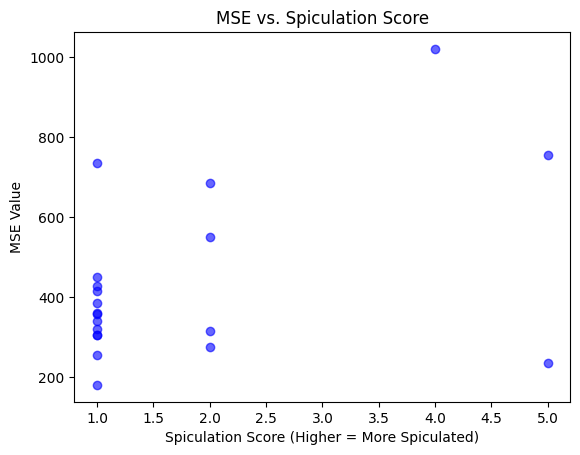

In [8]:
import matplotlib.pyplot as plt

spiculation_scores = [5, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 4, 5, 1, 1, 1, 1, 2, 1] 

plt.scatter(spiculation_scores, mse_values, color='blue', alpha=0.6)
plt.xlabel("Spiculation Score (Higher = More Spiculated)")
plt.ylabel("MSE Value")
plt.title("MSE vs. Spiculation Score")
plt.show()

In [9]:
import pandas as pd

# load the csv file
csv_file_path = "/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/LIDC_MaxSlices_cp_2024.csv"
df = pd.read_csv(csv_file_path)

# Fetching the spiculation Column
if "Spiculation" in df.columns:
    spiculation_scores = df["Spiculation"].tolist()
    print("Extracted spiculation scores: ", spiculation_scores[:20])
else:
    print("Error: 'spiculation' column not found in the CSV file.")

Extracted spiculation scores:  [5, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 4, 5, 1, 1, 1, 1, 2, 1]


### For alpha value = 0.1

In [10]:
import os
import glob
import re

def natural_sort_key(s):
    """Sort filenames numerically instead of lexicographically."""
    return [int(text) if text.isdigit() else text.lower() for text in re.split(r'(\d+)', s)]

# Define paths
original_folder = "/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/"
reconstructed_folder = "/Users/rohitmaity/Desktop/LIDC/Notebook/VAE generated images/alpha_0.1/lidc_reco_images_alpha_0.1/"

# Get and naturally sort image paths
original_paths = sorted(glob.glob(original_folder + "*.jpg"), key=natural_sort_key)[:20]
reconstructed_paths = sorted(glob.glob(reconstructed_folder + "*.jpg"), key=natural_sort_key)[:20]

print("Original Images: \n", original_paths)
print("\nReconstructed Images:\n", reconstructed_paths)

Original Images: 
 ['/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/1.jpg', '/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/2.jpg', '/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/3.jpg', '/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/4.jpg', '/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/5.jpg', '/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/6.jpg', '/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/7.jpg', '/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/8.jpg', '/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/9.jpg', '/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/10.jpg',

In [11]:
import os
import glob
import re

def natural_sort_key(s):
    """Sort filenames numerically instead of lexicographically."""
    return [int(text) if text.isdigit() else text.lower() for text in re.split(r'(\d+)', s)]

# Define paths
original_folder = "/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/"
base_reconstructed_folder = "/Users/rohitmaity/Desktop/LIDC/Notebook/VAE generated images/"

# Alpha values to compare
alpha_values = [0, 0.1, 0.5, 1, 2, 3]

# Get sorted original images
original_paths = sorted(glob.glob(original_folder + "*.jpg"), key=natural_sort_key)[:20]

# Store reconstructed paths for each alpha
reconstructed_images = {}

for alpha in alpha_values:
    alpha_folder = os.path.join(base_reconstructed_folder, f"alpha_{alpha}", f"lidc_reco_images_alpha_{alpha}")
    reconstructed_paths = sorted(glob.glob(alpha_folder + "/*.jpg"), key=natural_sort_key)[:20]
    
    if reconstructed_paths:
        reconstructed_images[alpha] = reconstructed_paths
    else:
        print(f"Warning: No images found for alpha={alpha}")

# Print output
print("Original Images:\n", original_paths)
for alpha, paths in reconstructed_images.items():
    print(f"\nReconstructed Images for alpha={alpha}:\n", paths)

Original Images:
 ['/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/1.jpg', '/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/2.jpg', '/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/3.jpg', '/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/4.jpg', '/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/5.jpg', '/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/6.jpg', '/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/7.jpg', '/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/8.jpg', '/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/9.jpg', '/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/10.jpg', 

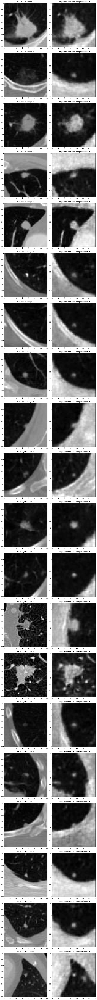

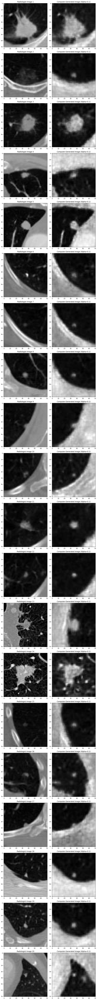

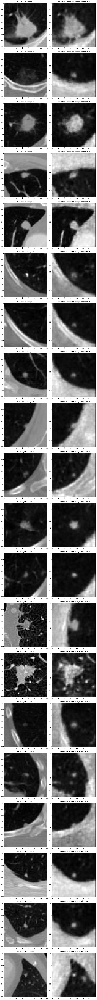

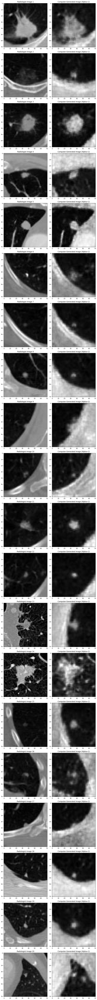

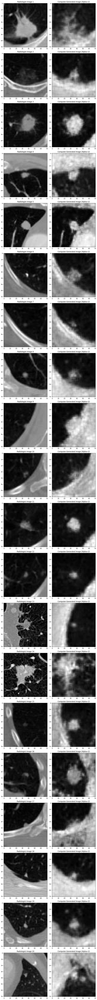

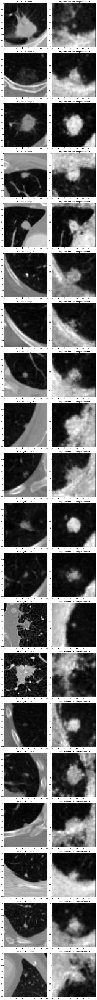

In [12]:
import cv2
import matplotlib.pyplot as plt
import re

# Number of images to display
for alpha,recon_paths in reconstructed_images.items():
    num_images = len(original_paths)

    fig, axes = plt.subplots(num_images, 2 , figsize=(10, 5 * num_images))

    for i in range(num_images):
        # Load images in grayscale
        original_img = cv2.imread(original_paths[i], cv2.IMREAD_GRAYSCALE)
        reconstructed_img = cv2.imread(recon_paths[i], cv2.IMREAD_GRAYSCALE)

        # Display images
        axes[i, 0].imshow(original_img, cmap="gray")
        axes[i, 0].set_title(f"Radiologist Image {i+1}")

        axes[i, 1].imshow(reconstructed_img, cmap="gray")
        axes[i, 1].set_title(f"Computer-Generated Image (Alpha={alpha})")

    plt.tight_layout()
    plt.show()

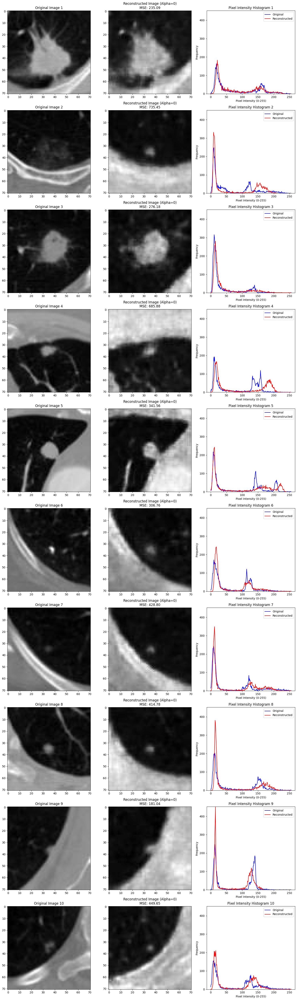

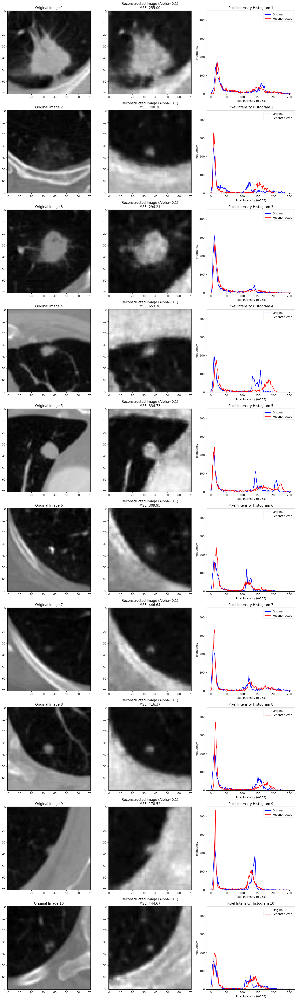

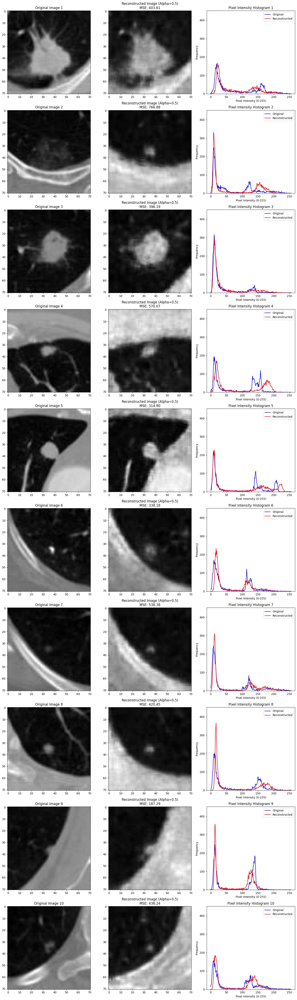

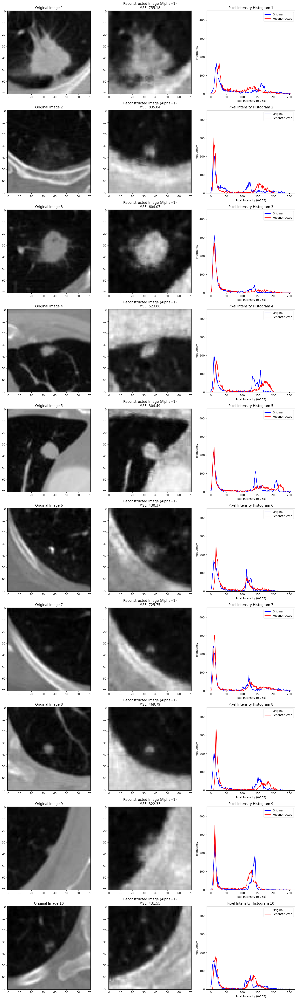

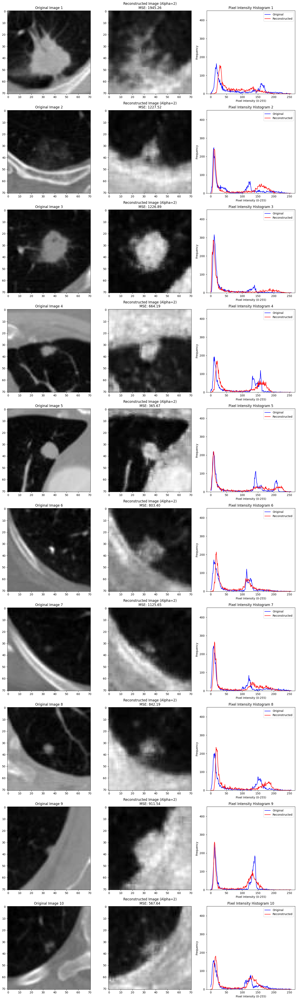

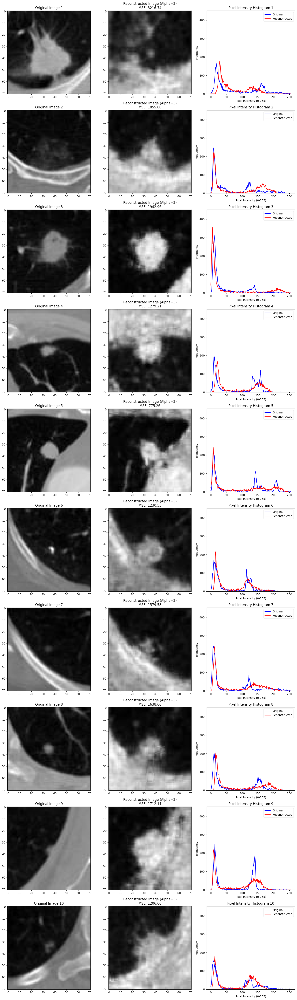

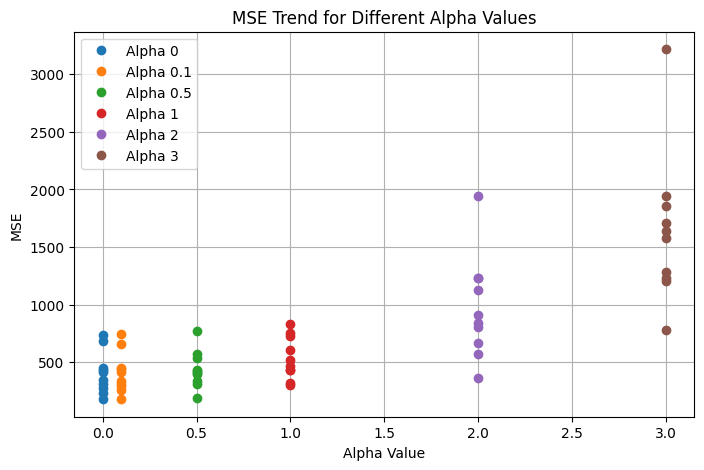

In [13]:
import os
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt
import re

def natural_sort_key(s):
    """Sort filenames numerically instead of lexicographically."""
    return [int(text) if text.isdigit() else text.lower() for text in re.split(r'(\d+)', s)]

def mean_squared_error(img1, img2):
    """Compute the Mean Squared Error (MSE) between two images."""
    return np.mean((img1.astype("float") - img2.astype("float")) ** 2)

# Define paths
original_folder = "/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/"
base_reconstructed_folder = "/Users/rohitmaity/Desktop/LIDC/Notebook/VAE generated images/"

# Alpha values to compare
alpha_values = [0, 0.1, 0.5, 1, 2, 3]

# Get sorted original images
original_paths = sorted(glob.glob(original_folder + "*.jpg"), key=natural_sort_key)[:10]  # Adjust as needed

# Dictionary to store reconstructed paths and MSE values
reconstructed_images = {}
mse_values = {}

for alpha in alpha_values:
    alpha_folder = os.path.join(base_reconstructed_folder, f"alpha_{alpha}", f"lidc_reco_images_alpha_{alpha}")
    reconstructed_paths = sorted(glob.glob(alpha_folder + "/*.jpg"), key=natural_sort_key)[:10]

    if reconstructed_paths:
        reconstructed_images[alpha] = reconstructed_paths
    else:
        print(f"Warning: No images found for alpha={alpha}")

# 📌 **Determine Global Max Frequency for Histogram Scaling**
global_max_freq = 0

for alpha, recon_paths in reconstructed_images.items():
    for i in range(len(original_paths)):
        original_img = cv2.imread(original_paths[i], cv2.IMREAD_GRAYSCALE)
        reconstructed_img = cv2.imread(recon_paths[i], cv2.IMREAD_GRAYSCALE)

        hist_original = cv2.calcHist([original_img], [0], None, [256], [0, 256])
        hist_reconstructed = cv2.calcHist([reconstructed_img], [0], None, [256], [0, 256])

        # Update global max frequency
        global_max_freq = max(global_max_freq, hist_original.max(), hist_reconstructed.max())

# 📌 **Compute MSE and Plot Histograms with Fixed Y-Axis Limit**
for alpha, recon_paths in reconstructed_images.items():
    num_images = len(original_paths)
    mse_values[alpha] = []

    fig, axes = plt.subplots(num_images, 3, figsize=(15, 5 * num_images))  # 3 columns: original, reconstructed, histogram

    for i in range(num_images):
        # Load images in grayscale
        original_img = cv2.imread(original_paths[i], cv2.IMREAD_GRAYSCALE)
        reconstructed_img = cv2.imread(recon_paths[i], cv2.IMREAD_GRAYSCALE)

        # Compute MSE
        mse = mean_squared_error(original_img, reconstructed_img)
        mse_values[alpha].append(mse)

        # Display images
        axes[i, 0].imshow(original_img, cmap="gray")
        axes[i, 0].set_title(f"Original Image {i+1}")

        axes[i, 1].imshow(reconstructed_img, cmap="gray")
        axes[i, 1].set_title(f"Reconstructed Image (Alpha={alpha})\nMSE: {mse:.2f}")

        # Compute histograms
        hist_original = cv2.calcHist([original_img], [0], None, [256], [0, 256])
        hist_reconstructed = cv2.calcHist([reconstructed_img], [0], None, [256], [0, 256])

        # Plot histograms with fixed y-axis scale
        axes[i, 2].plot(hist_original, label="Original", color='blue')
        axes[i, 2].plot(hist_reconstructed, label="Reconstructed", color='red')
        axes[i, 2].set_title(f"Pixel Intensity Histogram {i+1}")
        axes[i, 2].set_xlabel("Pixel Intensity (0-255)")
        axes[i, 2].set_ylabel("Frequency")
        axes[i, 2].legend()
        axes[i, 2].set_ylim(0, global_max_freq)  # **Set Y-axis limit**

    plt.tight_layout()
    plt.show()

# 📌 **Plot MSE Trend Across Alpha Values**
plt.figure(figsize=(8, 5))
for alpha in alpha_values:
    plt.plot([alpha] * len(mse_values[alpha]), mse_values[alpha], 'o', label=f"Alpha {alpha}")

plt.xlabel("Alpha Value")
plt.ylabel("MSE")
plt.title("MSE Trend for Different Alpha Values")
plt.legend()
plt.grid()
plt.show()

#### The MSE trend for different alpha values still holds based on the scatter plot. Here's what I observed from the graph:

Alpha 0 to 1:

    - MSE values are relatively low and clustered tightly.
    
    - The spread is limited, indicating lower variation.

Alpha 2 and 3:

    - MSE increases significantly.
    
    - The spread of MSE values becomes larger.
    
    - Some extreme values appear, especially for Alpha 3.

Higher Alpha = More Variation in Latent Representation

    - The alpha parameter controls the variance of the latent space in the VAE.
    
    - Low alpha (0, 0.1): Reconstructed images are closer to the original.
    
    - High alpha (1, 2, 3): More deviation, leading to potentially stronger spiculation patterns.

### Next Step: Quantify Spiculation Shift

#### Compare Spiculation Across Alpha Values

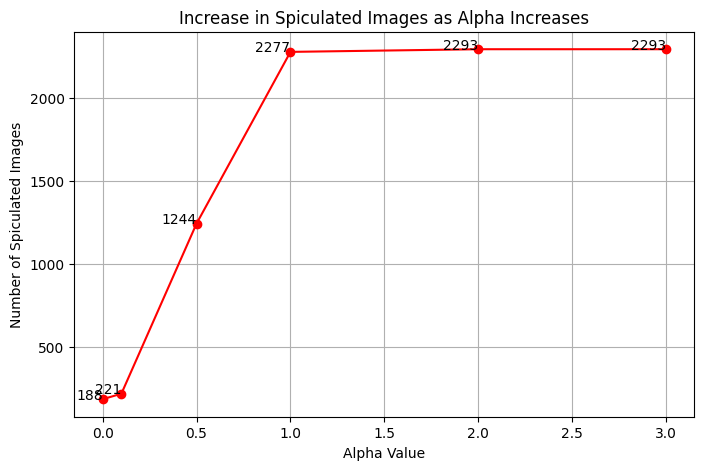

Alpha 0: 188 images with spiculation = 1
Alpha 0.1: 221 images with spiculation = 1
Alpha 0.5: 1244 images with spiculation = 1
Alpha 1: 2277 images with spiculation = 1
Alpha 2: 2293 images with spiculation = 1
Alpha 3: 2293 images with spiculation = 1


In [14]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# Define the base folder where alpha CSVs are stored
folder_path = "/Users/rohitmaity/Desktop/LIDC/Notebook/VAE generated images/"

# List of alpha values to analyze
alpha_values = [0, 0.1, 0.5, 1, 2, 3]

# Dictionary to store spiculation counts
spiculation_counts = {}

# Loop through each alpha value, read the corresponding CSV, and count spiculation
for alpha in alpha_values:
    csv_path = os.path.join(folder_path, f"alpha_{alpha}", f"df_alpha_{alpha}.csv")
    
    if not os.path.exists(csv_path):
        print(f"Warning: CSV file not found for alpha {alpha}")
        continue

    # Load CSV
    df = pd.read_csv(csv_path)

    # Check if 'LRV_labels' column exists
    if "LRV_labels" not in df.columns:
        print(f"Warning: 'LRV_labels' column missing in {csv_path}")
        continue

    # **Updated Condition: Count number of spiculated images (LRV_labels == 1)**
    spiculated_count = (df["LRV_labels"] == 1).sum()
    spiculation_counts[alpha] = spiculated_count

# Convert to DataFrame for plotting
spiculation_df = pd.DataFrame(list(spiculation_counts.items()), columns=["Alpha", "Spiculated Images"])

# Plot the spiculation count trend
plt.figure(figsize=(8, 5))
plt.plot(spiculation_df["Alpha"], spiculation_df["Spiculated Images"], marker="o", color="red", linestyle="-")
plt.xlabel("Alpha Value")
plt.ylabel("Number of Spiculated Images")
plt.title("Increase in Spiculated Images as Alpha Increases")
plt.grid(True)

# Annotate points
for i, row in spiculation_df.iterrows():
    plt.text(row["Alpha"], row["Spiculated Images"], f"{int(row['Spiculated Images'])}", ha="right", fontsize=10)

plt.show()

# Print the spiculation summary
for alpha, count in spiculation_counts.items():
    print(f"Alpha {alpha}: {count} images with spiculation = 1")

**As the alpha value increases, the number of spiculated images in the dataset rises significantly, particularly between Alpha 0.1 and Alpha 1, after which it stabilizes around Alpha 2 and 3. This suggests that increasing alpha effectively enhances the representation of spiculated nodules, helping to balance the dataset. Beyond Alpha 1, further increases in alpha contribute minimally to the number of spiculated cases, indicating a saturation point. This confirms that VAE-generated images can be used to augment underrepresented spiculated cases, potentially improving the performance of machine learning models by reducing class imbalance.**

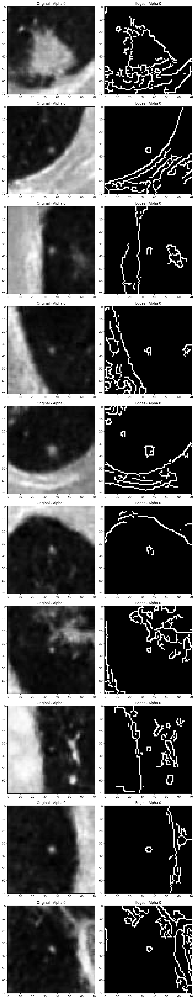

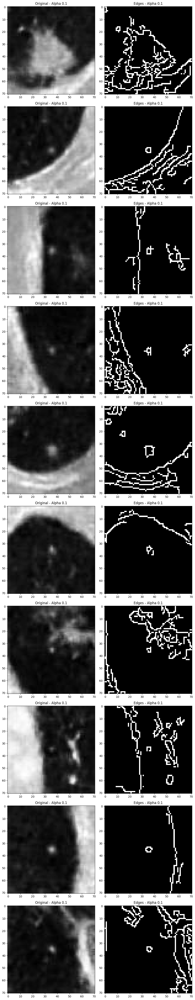

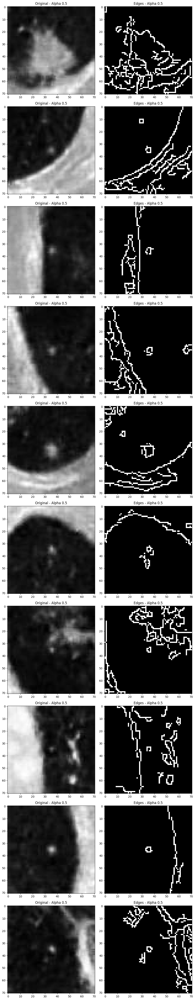

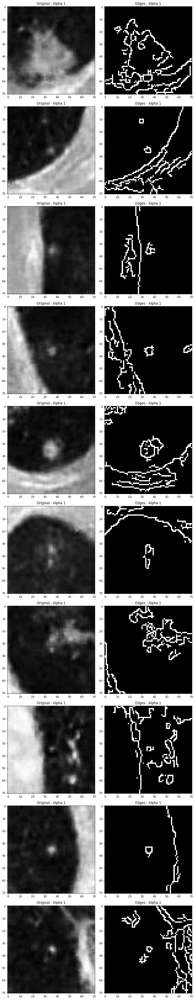

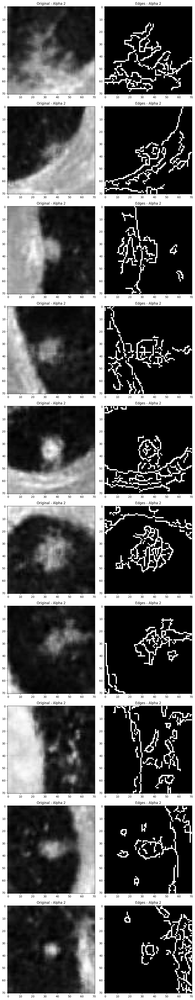

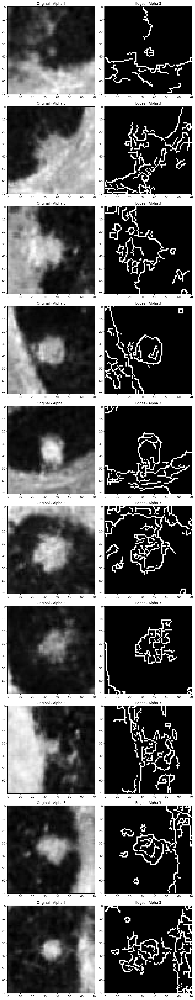

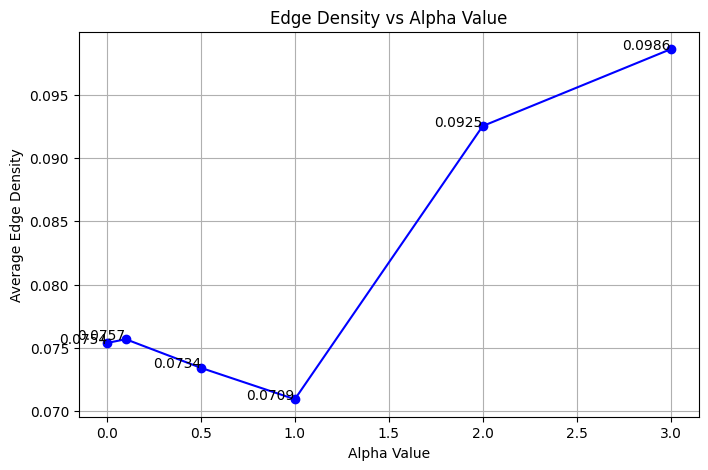

In [15]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Define paths
base_folder = "/Users/rohitmaity/Desktop/LIDC/Notebook/VAE generated images/"
original_folder = "/Users/rohitmaity/Desktop/LIDC/Notebook/Original_normalized_images/lidc_orig_norm_images/"
alpha_values = [0, 0.1, 0.5, 1, 2, 3]

# Parameters for Canny Edge Detection
low_threshold = 50
high_threshold = 150

# Store edge densities for analysis
edge_densities = {}

# Loop through alpha values
for alpha in alpha_values:
    folder_path = os.path.join(base_folder, f"alpha_{alpha}", f"lidc_reco_images_alpha_{alpha}")

    # Get the first 10 images for analysis
    image_paths = sorted([os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith('.jpg')])[:10]
    
    if not image_paths:
        print(f"Warning: No images found for alpha={alpha}")
        continue
    
    total_edges = 0
    total_pixels = 0

    # Plot original vs edge-detected images
    fig, axes = plt.subplots(len(image_paths), 2, figsize=(10, 5 * len(image_paths)))

    for i, img_path in enumerate(image_paths):
        # Read image in grayscale
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

        # Apply Canny Edge Detection
        edges = cv2.Canny(img, low_threshold, high_threshold)

        # Calculate Edge Density (edge pixels / total pixels)
        edge_density = np.sum(edges > 0) / img.size
        total_edges += np.sum(edges > 0)
        total_pixels += img.size

        # Plot Original vs Edge Detection
        axes[i, 0].imshow(img, cmap='gray')
        axes[i, 0].set_title(f"Original - Alpha {alpha}")

        axes[i, 1].imshow(edges, cmap='gray')
        axes[i, 1].set_title(f"Edges - Alpha {alpha}")

    plt.tight_layout()
    plt.show()

    # Store Average Edge Density
    edge_densities[alpha] = total_edges / total_pixels

# Plot Edge Density Trend
plt.figure(figsize=(8, 5))
plt.plot(list(edge_densities.keys()), list(edge_densities.values()), marker="o", color="blue", linestyle="-")
plt.xlabel("Alpha Value")
plt.ylabel("Average Edge Density")
plt.title("Edge Density vs Alpha Value")
plt.grid(True)

# Annotate points
for alpha, density in edge_densities.items():
    plt.text(alpha, density, f"{density:.4f}", ha="right", fontsize=10)

plt.show()

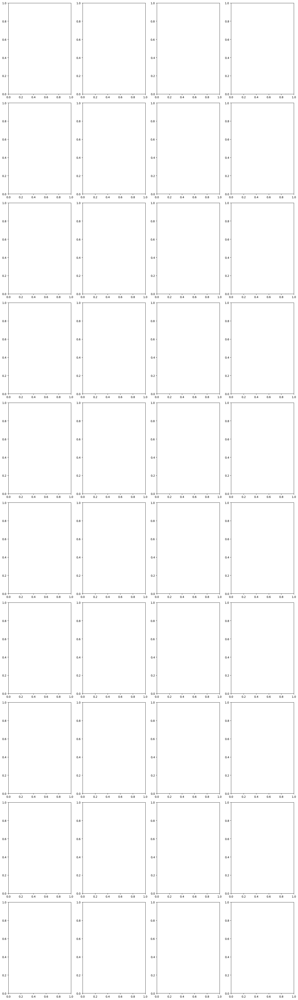

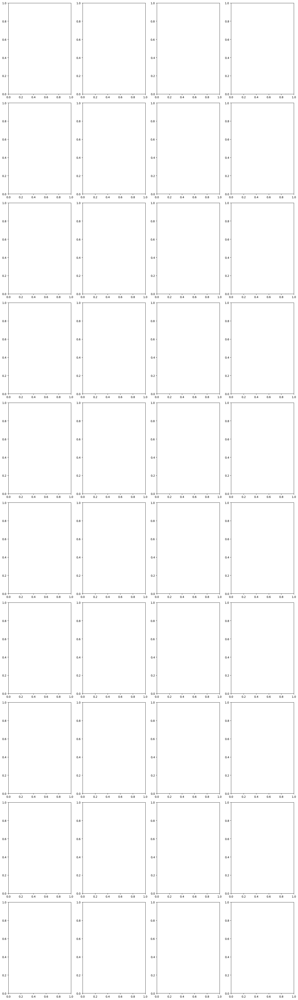

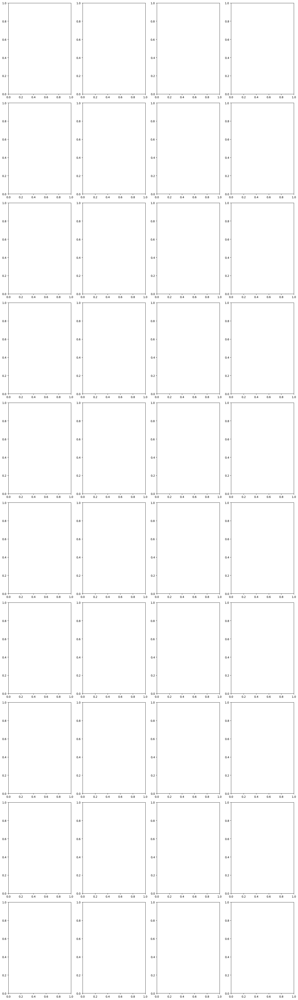

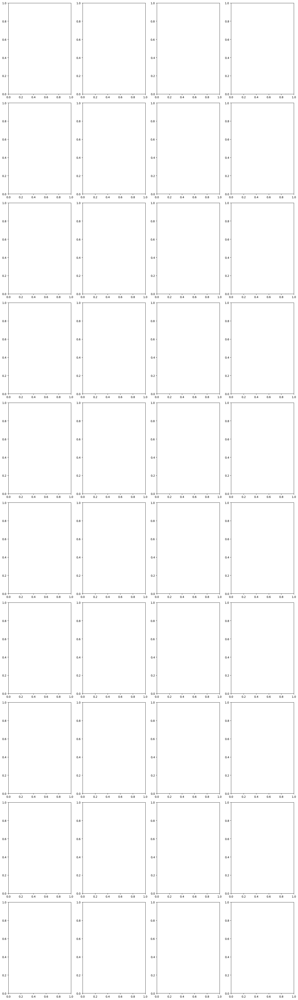

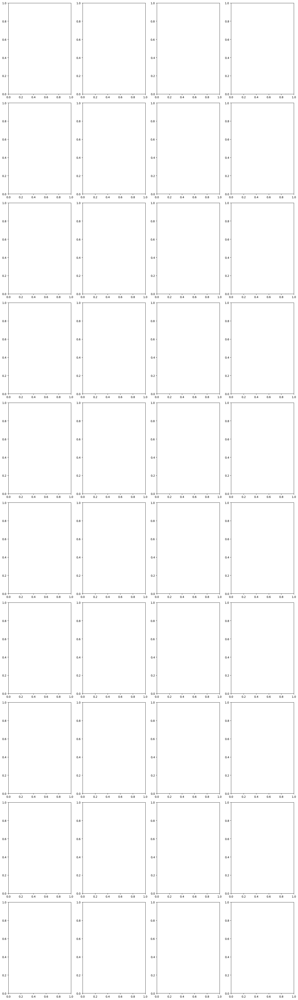

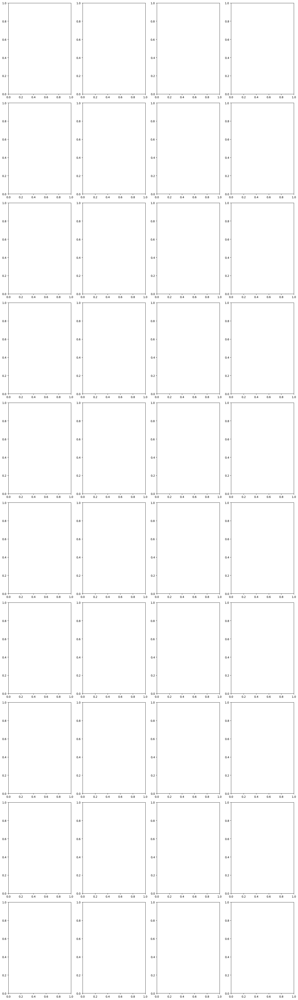

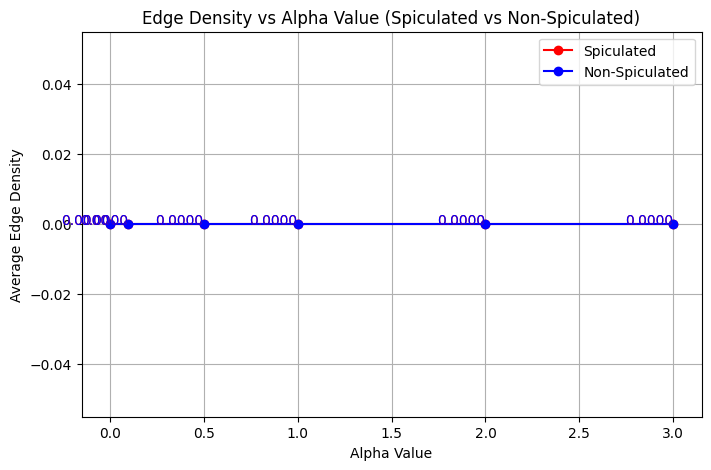


Summary of Edge Densities:
Alpha 0:
  - Spiculated Edge Density: 0.0000
  - Non-Spiculated Edge Density: 0.0000
----------------------------------------
Alpha 0.1:
  - Spiculated Edge Density: 0.0000
  - Non-Spiculated Edge Density: 0.0000
----------------------------------------
Alpha 0.5:
  - Spiculated Edge Density: 0.0000
  - Non-Spiculated Edge Density: 0.0000
----------------------------------------
Alpha 1:
  - Spiculated Edge Density: 0.0000
  - Non-Spiculated Edge Density: 0.0000
----------------------------------------
Alpha 2:
  - Spiculated Edge Density: 0.0000
  - Non-Spiculated Edge Density: 0.0000
----------------------------------------
Alpha 3:
  - Spiculated Edge Density: 0.0000
  - Non-Spiculated Edge Density: 0.0000
----------------------------------------


In [16]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Define paths
base_folder = "/Users/rohitmaity/Desktop/LIDC/Notebook/VAE generated images/"
csv_folder = "/Users/rohitmaity/Desktop/LIDC/Notebook/VAE generated images/"
alpha_values = [0, 0.1, 0.5, 1, 2, 3]

# Parameters for Canny Edge Detection
low_threshold = 50
high_threshold = 150
BATCH_SIZE = 10  # Limit to first N nodules for analysis

# Store edge densities
edge_densities = {"Spiculated": {}, "Non-Spiculated": {}}

# Process each alpha level
for alpha in alpha_values:
    csv_path = os.path.join(csv_folder, f"alpha_{alpha}", f"df_alpha_{alpha}.csv")
    image_folder = os.path.join(base_folder, f"alpha_{alpha}", f"lidc_reco_images_alpha_{alpha}")

    if not os.path.exists(csv_path):
        print(f"⚠️ Warning: CSV not found for alpha={alpha}")
        continue

    # Load CSV and check required column
    df = pd.read_csv(csv_path)
    if "LRV_labels" not in df.columns or "noduleid" not in df.columns:
        print(f"⚠️ Warning: Required columns missing in CSV for alpha={alpha}")
        continue

    # Filter spiculated (LRV_labels >= 3) and non-spiculated (LRV_labels < 3)
    spiculated_df = df[df["LRV_labels"] >= 3].head(BATCH_SIZE)
    non_spiculated_df = df[df["LRV_labels"] < 3].head(BATCH_SIZE)

    total_edges_spic = total_edges_non_spic = total_pixels_spic = total_pixels_non_spic = 0

    fig, axes = plt.subplots(BATCH_SIZE, 4, figsize=(15, 5 * BATCH_SIZE))

    for i, (spiculated, non_spiculated) in enumerate(zip(spiculated_df.iterrows(), non_spiculated_df.iterrows())):
        _, spiculated_row = spiculated
        _, non_spiculated_row = non_spiculated

        # Paths to images
        spic_img_path = os.path.join(image_folder, f"{spiculated_row['noduleid']}.jpg")
        non_spic_img_path = os.path.join(image_folder, f"{non_spiculated_row['noduleid']}.jpg")

        # Load images
        spic_img = cv2.imread(spic_img_path, cv2.IMREAD_GRAYSCALE)
        non_spic_img = cv2.imread(non_spic_img_path, cv2.IMREAD_GRAYSCALE)

        if spic_img is None or non_spic_img is None:
            print(f"⚠️ Warning: Missing image for alpha {alpha}, skipping")
            continue

        # Apply Canny Edge Detection
        edges_spic = cv2.Canny(spic_img, low_threshold, high_threshold)
        edges_non_spic = cv2.Canny(non_spic_img, low_threshold, high_threshold)

        # Calculate Edge Density
        edge_density_spic = np.sum(edges_spic > 0) / spic_img.size
        edge_density_non_spic = np.sum(edges_non_spic > 0) / non_spic_img.size

        total_edges_spic += np.sum(edges_spic > 0)
        total_pixels_spic += spic_img.size

        total_edges_non_spic += np.sum(edges_non_spic > 0)
        total_pixels_non_spic += non_spic_img.size

        # Display images
        axes[i, 0].imshow(spic_img, cmap='gray')
        axes[i, 0].set_title(f"Spiculated (Alpha {alpha})")

        axes[i, 1].imshow(edges_spic, cmap='gray')
        axes[i, 1].set_title("Edges - Spiculated")

        axes[i, 2].imshow(non_spic_img, cmap='gray')
        axes[i, 2].set_title(f"Non-Spiculated (Alpha {alpha})")

        axes[i, 3].imshow(edges_non_spic, cmap='gray')
        axes[i, 3].set_title("Edges - Non-Spiculated")

    plt.tight_layout()
    plt.show()

    # Store average edge density
    edge_densities["Spiculated"][alpha] = total_edges_spic / total_pixels_spic if total_pixels_spic > 0 else 0
    edge_densities["Non-Spiculated"][alpha] = total_edges_non_spic / total_pixels_non_spic if total_pixels_non_spic > 0 else 0

# 📊 Plot Edge Density Trend
plt.figure(figsize=(8, 5))
plt.plot(alpha_values, [edge_densities["Spiculated"].get(a, 0) for a in alpha_values], marker="o", linestyle="-", color="red", label="Spiculated")
plt.plot(alpha_values, [edge_densities["Non-Spiculated"].get(a, 0) for a in alpha_values], marker="o", linestyle="-", color="blue", label="Non-Spiculated")

plt.xlabel("Alpha Value")
plt.ylabel("Average Edge Density")
plt.title("Edge Density vs Alpha Value (Spiculated vs Non-Spiculated)")
plt.legend()
plt.grid(True)

# Annotate points
for alpha in alpha_values:
    if alpha in edge_densities["Spiculated"]:
        plt.text(alpha, edge_densities["Spiculated"][alpha], f"{edge_densities['Spiculated'][alpha]:.4f}", ha="right", fontsize=10, color="red")
    if alpha in edge_densities["Non-Spiculated"]:
        plt.text(alpha, edge_densities["Non-Spiculated"][alpha], f"{edge_densities['Non-Spiculated'][alpha]:.4f}", ha="right", fontsize=10, color="blue")

plt.show()

# 📌 Print Summary
print("\nSummary of Edge Densities:")
for alpha in alpha_values:
    print(f"Alpha {alpha}:")
    print(f"  - Spiculated Edge Density: {edge_densities['Spiculated'].get(alpha, 'N/A'):.4f}")
    print(f"  - Non-Spiculated Edge Density: {edge_densities['Non-Spiculated'].get(alpha, 'N/A'):.4f}")
    print("-" * 40)